In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")
import matplotlib.patches as mpatches 
plt.rcParams["figure.figsize"] = (10, 6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.max_row', 10 )


In [2]:
pip install geopandas matplotlib

Note: you may need to restart the kernel to use updated packages.


In [3]:
import geopandas as gpd 


In [4]:
buurt_grenzen = gpd.read_file("buurt_2020_v3.shp")

In [5]:
gdf_postcode = gpd.read_file("gdf_postcode.shp")

In [6]:
print(gdf_postcode.geometry.head())

0    POLYGON ((233438.109 581446.772, 233438.908 58...
1    POLYGON ((233374.874 581490.712, 233378.106 58...
2    MULTIPOLYGON (((233440.703 581357.647, 233417....
3    POLYGON ((233493.931 581473.687, 233494.015 58...
4    POLYGON ((233364.15 581578.063, 233364.382 581...
Name: geometry, dtype: geometry


In [7]:
buurt_grenzen

,BU_CODE,BU_NAAM,WK_CODE,GM_CODE,GM_NAAM,IND_WBI,H2O,POSTCODE,DEK_PERC,OAD,...,AV20PODIUM,AF_MUSEUM,AV5_MUSEUM,AV10MUSEUM,AV20MUSEUM,JRSTATCODE,JAAR,Shape_Leng,Shape_Area,geometry
0,BU00109998,None,WK001099,GM0010,Delfzijl,-99999999,JA,None,-99999999,-99999999,...,-99999999.000,-99999999.000,-99999999.000,-99999999.000,-99999999.000,2020BU00109998,2020,128728.007,91292354.653,"MULTIPOLYGON (((268674.309 592382.331, 268667...."
1,BU00349997,None,WK003499,GM0034,Almere,-99999999,JA,None,-99999999,-99999999,...,-99999999.000,-99999999.000,-99999999.000,-99999999.000,-99999999.000,2020BU00349997,2020,122665.359,109562253.489,"MULTIPOLYGON (((150213.998 479503.726, 150087...."
2,BU00509997,None,WK005099,GM0050,Zeewolde,-99999999,JA,None,-99999999,-99999999,...,-99999999.000,-99999999.000,-99999999.000,-99999999.000,-99999999.000,2020BU00509997,2020,83290.774,16330502.317,"MULTIPOLYGON (((154927.535 474979.29, 154931.2..."
3,BU00609998,None,WK006099,GM0060,Ameland,-99999999,JA,None,-99999999,-99999999,...,-99999999.000,-99999999.000,-99999999.000,-99999999.000,-99999999.000,2020BU00609998,2020,156406.894,208591384.094,"POLYGON ((196000 610000, 196000 608000, 195250..."
4,BU00729998,None,WK007299,GM0072,Harlingen,-99999999,JA,None,-99999999,-99999999,...,-99999999.000,-99999999.000,-99999999.000,-99999999.000,-99999999.000,2020BU00729998,2020,104274.683,361832253.647,"MULTIPOLYGON (((158392.775 580357.5, 158387.71..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13898,BU19781901,Waal-Dorp,WK197819,GM1978,Molenlanden,1,NEE,2968,1,50,...,7.000,4.200,2.000,2.000,13.000,2020BU19781901,2020,2380.324,53346.702,"POLYGON ((121602.9 439121.61, 121602.41 439121..."
13899,BU19782001,Wijngaarden-Buitengebied,WK197820,GM1978,Molenlanden,1,NEE,3366,1,18,...,9.000,5.100,0.000,2.000,13.000,2020BU19782001,2020,14157.218,5795862.203,"POLYGON ((113270.606 430220.247, 113283.2 4302..."
13900,BU19782002,Kern-Dorp,WK197820,GM1978,Molenlanden,1,NEE,3366,1,75,...,10.000,4.500,1.000,2.000,13.000,2020BU19782002,2020,2221.741,114372.926,"POLYGON ((112320.311 428786.584, 112334.463 42..."
13901,BU19782003,Lintbebouwing-Oost,WK197820,GM1978,Molenlanden,1,NEE,3366,1,34,...,9.100,4.600,0.900,2.000,12.700,2020BU19782003,2020,6244.966,278206.982,"POLYGON ((113206.825 428924.002, 113251.815 42..."


In [8]:
buurt_grenzen_groningen = buurt_grenzen[buurt_grenzen['GM_NAAM'] == 'Groningen']
buurt_grenzen_groningen

,BU_CODE,BU_NAAM,WK_CODE,GM_CODE,GM_NAAM,IND_WBI,H2O,POSTCODE,DEK_PERC,OAD,...,AV20PODIUM,AF_MUSEUM,AV5_MUSEUM,AV10MUSEUM,AV20MUSEUM,JRSTATCODE,JAAR,Shape_Leng,Shape_Area,geometry
149,BU00140000,Binnenstad-Noord,WK001400,GM0014,Groningen,1,NEE,9712,1,6472,...,9.000,0.300,5.000,6.000,17.000,2020BU00140000,2020,2698.018,391104.910,"POLYGON ((233836.216 582380.178, 233892.194 58..."
150,BU00140001,Binnenstad-Zuid,WK001400,GM0014,Groningen,1,NEE,9711,1,6187,...,9.000,0.400,5.000,5.700,17.000,2020BU00140001,2020,3162.224,591016.392,"POLYGON ((233933.98 581951.34, 233973.6 581948..."
151,BU00140002,Binnenstad-Oost,WK001400,GM0014,Groningen,1,NEE,9711,3,5967,...,9.000,0.500,5.000,5.400,17.000,2020BU00140002,2020,2928.375,288705.444,"POLYGON ((233998.79 582526.54, 234278.52 58229..."
152,BU00140003,Binnenstad-West,WK001400,GM0014,Groningen,1,NEE,9718,1,6066,...,9.000,0.300,5.000,6.300,17.000,2020BU00140003,2020,1710.776,108141.342,"POLYGON ((233187.24 581984.19, 233217.79 58194..."
153,BU00140004,Noorderplantsoen,WK001400,GM0014,Groningen,1,NEE,9717,2,6127,...,9.000,0.600,5.000,6.000,17.000,2020BU00140004,2020,2747.969,195792.111,"POLYGON ((233379.79 582869.67, 233404.22 58280..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,BU00141905,Buitengebied Noordlaren,WK001419,GM0014,Groningen,3,NEE,9479,1,34,...,10.100,5.300,0.200,4.000,13.100,2020BU00141905,2020,23423.996,6437653.655,"POLYGON ((241641.492 573790.346, 241651.42 573..."
295,BU00141906,Zuidlaardermeer,WK001419,GM0014,Groningen,3,NEE,9479,1,33,...,-99999999.000,-99999999.000,-99999999.000,-99999999.000,-99999999.000,2020BU00141906,2020,8906.585,2591845.567,"POLYGON ((241893.772 574226.387, 241900.092 57..."
296,BU00141907,Noordlaarderbos,WK001419,GM0014,Groningen,3,NEE,9479,1,22,...,-99999999.000,-99999999.000,-99999999.000,-99999999.000,-99999999.000,2020BU00141907,2020,5579.238,996705.151,"POLYGON ((239397.057 571419.237, 239527.749 57..."
297,BU00141908,Appelbergen Glimmen,WK001419,GM0014,Groningen,3,NEE,9756,1,124,...,-99999999.000,-99999999.000,-99999999.000,-99999999.000,-99999999.000,2020BU00141908,2020,3653.720,325390.764,"POLYGON ((238356.19 573564.25, 238369.973 5735..."


In [9]:
buurt_grenzen[buurt_grenzen['BU_NAAM'] == 'Haren']

,BU_CODE,BU_NAAM,WK_CODE,GM_CODE,GM_NAAM,IND_WBI,H2O,POSTCODE,DEK_PERC,OAD,...,AV20PODIUM,AF_MUSEUM,AV5_MUSEUM,AV10MUSEUM,AV20MUSEUM,JRSTATCODE,JAAR,Shape_Leng,Shape_Area,geometry
8654,BU08281100,Haren,WK082811,GM0828,Oss,3,NEE,5368,1,83,...,5.900,7.300,0.000,1.000,6.600,2020BU08281100,2020,10016.143,3749225.913,"POLYGON ((168068.291 424896.709, 168075.602 42..."


In [10]:
buurt_grenzen_groningen.geometry

149    POLYGON ((233836.216 582380.178, 233892.194 58...
150    POLYGON ((233933.98 581951.34, 233973.6 581948...
151    POLYGON ((233998.79 582526.54, 234278.52 58229...
152    POLYGON ((233187.24 581984.19, 233217.79 58194...
153    POLYGON ((233379.79 582869.67, 233404.22 58280...
                             ...                        
294    POLYGON ((241641.492 573790.346, 241651.42 573...
295    POLYGON ((241893.772 574226.387, 241900.092 57...
296    POLYGON ((239397.057 571419.237, 239527.749 57...
297    POLYGON ((238356.19 573564.25, 238369.973 5735...
298    POLYGON ((239180.009 573500.18, 239167.374 573...
Name: geometry, Length: 150, dtype: geometry

In [11]:
df_buurt = pd.read_csv('df_buurt_elk_2021_resultaat_merge.csv')
df_buurt

,Buurtnaam,AANSLUITINGEN_AANTAL,totaal,elk_gemiddeld,BuurtCode
0,Badstratenbuurt,461,1372312,2977,BU00140105
1,Bangeweer,102,381421,3739,BU00140809
2,Beijum-Oost,3281,8454023,2577,BU00141101
3,Beijum-West,3023,7784309,2575,BU00141100
4,Binnenstad-Noord,2280,14088994,6179,BU00140000
...,...,...,...,...,...
98,Winschoterdiep,98,1368492,13964,BU00140508
99,Zeeheldenbuurt,1118,3025714,2706,BU00140106
100,Zernike Campus,21,558670,26603,BU00141003
101,Zilvermeer,86,267141,3106,BU00141206


In [12]:
df_buurt[df_buurt['Buurtnaam'] == 'Haren']

,Buurtnaam,AANSLUITINGEN_AANTAL,totaal,elk_gemiddeld,BuurtCode


In [13]:
df_buurt['BU_CODE'] = df_buurt["BuurtCode"]

In [14]:
df_buurt = df_buurt.drop('BuurtCode' , axis = 1 )
df_buurt

,Buurtnaam,AANSLUITINGEN_AANTAL,totaal,elk_gemiddeld,BU_CODE
0,Badstratenbuurt,461,1372312,2977,BU00140105
1,Bangeweer,102,381421,3739,BU00140809
2,Beijum-Oost,3281,8454023,2577,BU00141101
3,Beijum-West,3023,7784309,2575,BU00141100
4,Binnenstad-Noord,2280,14088994,6179,BU00140000
...,...,...,...,...,...
98,Winschoterdiep,98,1368492,13964,BU00140508
99,Zeeheldenbuurt,1118,3025714,2706,BU00140106
100,Zernike Campus,21,558670,26603,BU00141003
101,Zilvermeer,86,267141,3106,BU00141206


In [15]:
df_buurt[df_buurt['Buurtnaam'] == 'Peizerweg']

,Buurtnaam,AANSLUITINGEN_AANTAL,totaal,elk_gemiddeld,BU_CODE
71,Peizerweg,60,782435,13041,BU00140110


In [16]:
buurt_grenzen_groningen.head(1)

,BU_CODE,BU_NAAM,WK_CODE,GM_CODE,GM_NAAM,IND_WBI,H2O,POSTCODE,DEK_PERC,OAD,...,AV20PODIUM,AF_MUSEUM,AV5_MUSEUM,AV10MUSEUM,AV20MUSEUM,JRSTATCODE,JAAR,Shape_Leng,Shape_Area,geometry
149,BU00140000,Binnenstad-Noord,WK001400,GM0014,Groningen,1,NEE,9712,1,6472,...,9.000,0.300,5.000,6.000,17.000,2020BU00140000,2020,2698.018,391104.910,"POLYGON ((233836.216 582380.178, 233892.194 58..."


In [17]:
 buurt_grenzen_groningen =buurt_grenzen_groningen[["BU_CODE","geometry"]]
buurt_grenzen_groningen

,BU_CODE,geometry
149,BU00140000,"POLYGON ((233836.216 582380.178, 233892.194 58..."
150,BU00140001,"POLYGON ((233933.98 581951.34, 233973.6 581948..."
151,BU00140002,"POLYGON ((233998.79 582526.54, 234278.52 58229..."
152,BU00140003,"POLYGON ((233187.24 581984.19, 233217.79 58194..."
153,BU00140004,"POLYGON ((233379.79 582869.67, 233404.22 58280..."
...,...,...
294,BU00141905,"POLYGON ((241641.492 573790.346, 241651.42 573..."
295,BU00141906,"POLYGON ((241893.772 574226.387, 241900.092 57..."
296,BU00141907,"POLYGON ((239397.057 571419.237, 239527.749 57..."
297,BU00141908,"POLYGON ((238356.19 573564.25, 238369.973 5735..."


In [18]:
buurt_grenzen_groningen[buurt_grenzen_groningen['BU_CODE'] == 'BU00140110']

,BU_CODE,geometry


In [19]:
df_grenz_buurt_merge = df_buurt.merge(buurt_grenzen_groningen, left_on='BU_CODE', right_on='BU_CODE')
df_grenz_buurt_merge

,Buurtnaam,AANSLUITINGEN_AANTAL,totaal,elk_gemiddeld,BU_CODE,geometry
0,Badstratenbuurt,461,1372312,2977,BU00140105,"POLYGON ((233099.86 581451.15, 233124.58 58140..."
1,Bangeweer,102,381421,3739,BU00140809,"POLYGON ((231436.7 580958.57, 231513.04 580627..."
2,Beijum-Oost,3281,8454023,2577,BU00141101,"POLYGON ((235328.237 586088.449, 235341.641 58..."
3,Beijum-West,3023,7784309,2575,BU00141100,"POLYGON ((235089.093 586124.464, 235097.63 586..."
4,Binnenstad-Noord,2280,14088994,6179,BU00140000,"POLYGON ((233836.216 582380.178, 233892.194 58..."
...,...,...,...,...,...,...
95,Winschoterdiep,98,1368492,13964,BU00140508,"POLYGON ((236137.59 580321.329, 236212.839 580..."
96,Zeeheldenbuurt,1118,3025714,2706,BU00140106,"POLYGON ((232664.12 581508.66, 232728.391 5814..."
97,Zernike Campus,21,558670,26603,BU00141003,"POLYGON ((231373.78 585459.79, 231364.975 5854..."
98,Zilvermeer,86,267141,3106,BU00141206,"POLYGON ((236365.055 584219.457, 236367 584217..."


In [20]:
df_grenz_buurt_merge.isnull().sum()

Buurtnaam               0
AANSLUITINGEN_AANTAL    0
totaal                  0
elk_gemiddeld           0
BU_CODE                 0
geometry                0
dtype: int64

In [21]:
type(df_grenz_buurt_merge.geometry.iloc[0])

shapely.geometry.polygon.Polygon

In [22]:
gdf = gpd.GeoDataFrame(df_grenz_buurt_merge, geometry = "geometry")
gdf

,Buurtnaam,AANSLUITINGEN_AANTAL,totaal,elk_gemiddeld,BU_CODE,geometry
0,Badstratenbuurt,461,1372312,2977,BU00140105,"POLYGON ((233099.86 581451.15, 233124.58 58140..."
1,Bangeweer,102,381421,3739,BU00140809,"POLYGON ((231436.7 580958.57, 231513.04 580627..."
2,Beijum-Oost,3281,8454023,2577,BU00141101,"POLYGON ((235328.237 586088.449, 235341.641 58..."
3,Beijum-West,3023,7784309,2575,BU00141100,"POLYGON ((235089.093 586124.464, 235097.63 586..."
4,Binnenstad-Noord,2280,14088994,6179,BU00140000,"POLYGON ((233836.216 582380.178, 233892.194 58..."
...,...,...,...,...,...,...
95,Winschoterdiep,98,1368492,13964,BU00140508,"POLYGON ((236137.59 580321.329, 236212.839 580..."
96,Zeeheldenbuurt,1118,3025714,2706,BU00140106,"POLYGON ((232664.12 581508.66, 232728.391 5814..."
97,Zernike Campus,21,558670,26603,BU00141003,"POLYGON ((231373.78 585459.79, 231364.975 5854..."
98,Zilvermeer,86,267141,3106,BU00141206,"POLYGON ((236365.055 584219.457, 236367 584217..."


In [23]:
type(gdf.elk_gemiddeld.iloc[0])


numpy.int64

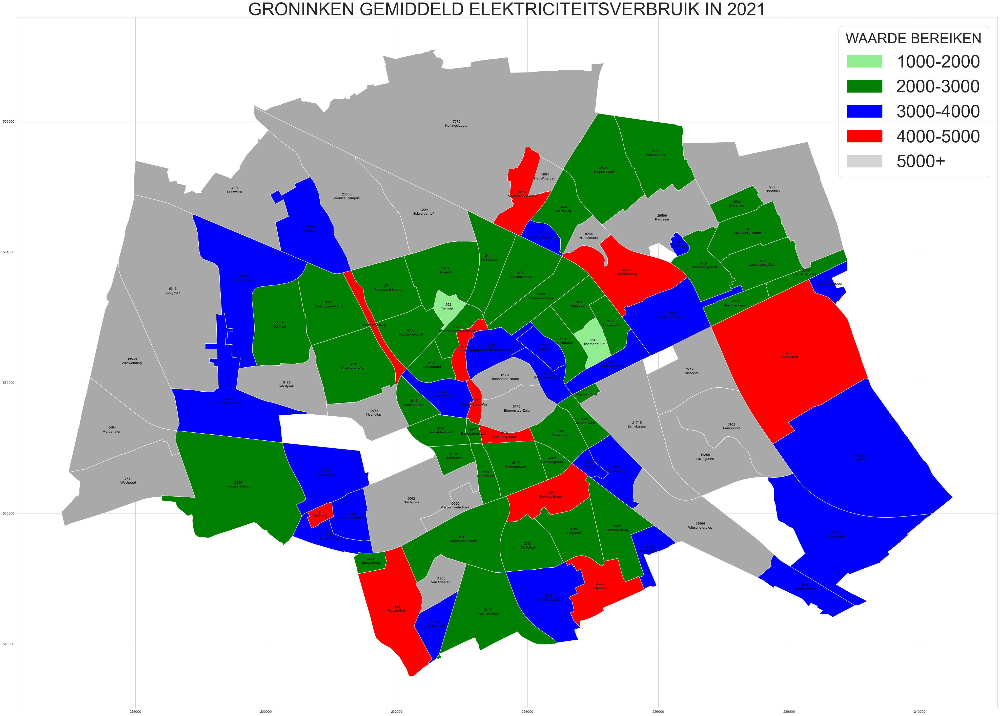

In [24]:
# 4. Haritayı çiz ve renklendir
# Renkleri belirleme fonksiyonu
def color_scale(value):
    if pd.isnull(value):  # Değerin boş olup olmadığını kontrol et
        return 'grey'  # Boş değer için varsayılan renk
    elif 1000 <= value < 2000:
        return 'lightgreen'
    elif 2000 <= value < 3000:
        return 'green'
    elif 3000 <= value < 4000:
        return 'blue'
    elif 4000 <= value < 5000:
        return 'red'
    elif value >= 5000:
        return 'darkgrey'
    else:
        return 'grey'  # Eğer başka bir değer varsa

# Renkleri atama
gdf['color'] = gdf['elk_gemiddeld'].apply(color_scale)
gdf['centroid'] = gdf.geometry.centroid
fig, ax = plt.subplots(figsize=(50, 50))
gdf.plot(ax=ax, color=gdf['color'], edgecolor='white'  ) # Sınırları çiz
for idx, row in gdf.iterrows():
    ax.text(row['centroid'].x, row['centroid'].y - 30, s=row['Buurtnaam'],
         horizontalalignment='center', fontsize=10, color='black')
    ax.text(s=row['elk_gemiddeld'],  # Değer
             x=row['centroid'].x, 
             y=row['centroid'].y + 30,  # Y koordinatını biraz aşağıda ayarlayın
             horizontalalignment='center', fontsize=10, color='black')

legend_patches = [
    mpatches.Patch(color='lightgreen', label='1000-2000'),
    mpatches.Patch(color='green', label='2000-3000'),
    mpatches.Patch(color='blue', label='3000-4000'),
    mpatches.Patch(color='red', label='4000-5000'),
    mpatches.Patch(color='lightgray', label='5000+')
]
# plt.savefig('groningen_elk_2021_kaart.pdf', dpi = 300, bbox_inches = 'tight') # haritayi kaydetme 
# Efsaneyi (legend) haritaya ekleyin
plt.legend(handles=legend_patches, title="WAARDE BEREIKEN", loc='upper right', prop = {'size' : 50} , title_fontsize = 40)
plt.title('GRONINKEN GEMIDDELD ELEKTRICITEITSVERBRUIK IN 2021' , fontsize = 50 )
plt.show()

In [25]:
postcode_grenzen = gpd.read_file("CBS_PC6_2016_v2.shp")

In [26]:
postcode_grenzen

,Postcode,INWONER,MAN,VROUW,INW_014,INW_1524,INW_2544,INW_4564,INW_65PL,GEBOORTE,...,AV5_ZIEK_E,AV10ZIEK_E,AV20ZIEK_E,AFS_ZIEK_I,AV5_ZIEK_I,AV10ZIEK_I,AV20ZIEK_I,AFS_APOTH,AFS_HAPOST,geometry
0,1011AB,-99997,-99997,-99997,-99997,-99997,-99997,-99997,-99997,-99997,...,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,"POLYGON ((122176.792 487929.514, 122180.323 48..."
1,1011AC,20,10,10,-99997,-99997,5,5,5,-99997,...,1.000,6.000,12.000,2.100,2.000,8.000,15.000,1.200,3.500,"POLYGON ((122392.287 487876.886, 122420.352 48..."
2,1011AD,-99997,-99997,-99997,-99997,-99997,-99997,-99997,-99997,-99997,...,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,"POLYGON ((122097.418 487812.355, 122100.396 48..."
3,1011AE,-99997,-99997,-99997,-99997,-99997,-99997,-99997,-99997,-99997,...,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,"MULTIPOLYGON (((122641.343 487605.133, 122585...."
4,1011AG,5,5,-99997,-99997,-99997,5,-99997,-99997,-99997,...,1.000,7.000,13.000,1.400,2.000,9.000,17.000,0.300,2.700,"POLYGON ((122026.632 487690.998, 122032.23 487..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
455613,9999XG,10,5,-99997,-99997,-99997,-99997,5,-99997,-99997,...,0.000,0.000,1.000,8.500,0.000,1.000,2.000,-99997.000,8.900,"POLYGON ((235730.815 598099.336, 235783.415 59..."
455614,9999XH,10,5,-99997,-99997,-99997,-99997,-99997,-99997,-99997,...,0.000,0.000,1.000,8.300,0.000,1.000,2.000,-99997.000,8.600,"MULTIPOLYGON (((235967.412 596285.322, 235960...."
455615,9999XJ,20,10,10,-99997,-99997,-99997,10,5,-99997,...,0.000,0.000,1.300,7.400,0.000,1.000,2.300,5.100,7.800,"POLYGON ((234888.566 598002.879, 235571.823 59..."
455616,9999XK,15,5,5,-99997,-99997,-99997,5,-99997,-99997,...,0.000,0.000,1.000,8.400,0.000,1.000,2.000,5.600,8.800,"POLYGON ((235708.216 597883.634, 235709.435 59..."


In [27]:
df1 = pd.read_csv('df_groningen_elk_2021_nieuw.csv')
df1

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD
0,9711AA,9711 AC,13,6879.080
1,9711AD,9711 AE,12,5443.750
2,9711AG,9711 AG,48,3559.960
3,9711AH,9711 AJ,30,1387.900
4,9711AK,9711 AK,15,1476.330
...,...,...,...,...
4689,9746TG,9746 TJ,17,12235.760
4690,9746TK,9746 TL,26,4263.880
4691,9746TM,9746 TN,15,4250.130
4692,9747AC,9747 AJ,10,6730.500


In [28]:
df1[df1['POSTCODE_VAN'] == '9401BK']

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD


In [29]:
df = pd.read_csv("df_buurt_elk_2021_nieuw.csv" , sep=',')
df0 = df.copy() 

In [30]:
df

,POSTCODE_VAN,POSTCODE_TOT,PC6,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Buurtnaam,totaal
0,9711AA,9711 AC,9711AA,13,6879.080,Binnenstad-Zuid,89427
1,9711AD,9711 AE,9711AD,12,5443.750,Binnenstad-Zuid,65328
2,9711AG,9711 AG,9711AG,48,3559.960,Binnenstad-Zuid,170880
3,9711AH,9711 AJ,9711AH,30,1387.900,Binnenstad-Zuid,41640
4,9711AK,9711 AK,9711AK,15,1476.330,Binnenstad-Zuid,22140
...,...,...,...,...,...,...,...
4758,9746TK,9746 TL,9746TK,26,4263.880,Dorkwerd,110864
4759,9746TM,9746 TN,9746TM,15,4250.130,Dorkwerd,63750
4760,9747AC,9747 AJ,9747AC,10,6730.500,Zernike Campus,67300
4761,9747AM,9747 AV,9747AM,11,44669.910,Zernike Campus,491370


In [31]:
df[df['Buurtnaam'] == 'Haren']

,POSTCODE_VAN,POSTCODE_TOT,PC6,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Buurtnaam,totaal


In [32]:
postcode_grenzen[postcode_grenzen['Postcode'] =='5368AC']

,Postcode,INWONER,MAN,VROUW,INW_014,INW_1524,INW_2544,INW_4564,INW_65PL,GEBOORTE,...,AV5_ZIEK_E,AV10ZIEK_E,AV20ZIEK_E,AFS_ZIEK_I,AV5_ZIEK_I,AV10ZIEK_I,AV20ZIEK_I,AFS_APOTH,AFS_HAPOST,geometry
257063,5368AC,50,30,20,10,5,10,20,10,-99997,...,0.000,0.000,1.000,8.500,0.000,1.000,4.000,3.000,6.800,"POLYGON ((168666.605 424650.869, 168740.294 42..."


In [33]:
df1['POSTCODE_TOT'] = df1['POSTCODE_TOT'].str.replace(' ','' )
df1

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD
0,9711AA,9711AC,13,6879.080
1,9711AD,9711AE,12,5443.750
2,9711AG,9711AG,48,3559.960
3,9711AH,9711AJ,30,1387.900
4,9711AK,9711AK,15,1476.330
...,...,...,...,...
4689,9746TG,9746TJ,17,12235.760
4690,9746TK,9746TL,26,4263.880
4691,9746TM,9746TN,15,4250.130
4692,9747AC,9747AJ,10,6730.500


In [34]:
df_van = pd.merge(df1,postcode_grenzen, left_on= 'POSTCODE_VAN' , right_on='Postcode' )
df_van


,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,INWONER,MAN,VROUW,INW_014,INW_1524,...,AV5_ZIEK_E,AV10ZIEK_E,AV20ZIEK_E,AFS_ZIEK_I,AV5_ZIEK_I,AV10ZIEK_I,AV20ZIEK_I,AFS_APOTH,AFS_HAPOST,geometry
0,9711AA,9711AC,13,6879.080,9711AA,20,20,-99997,-99997,15,...,2.000,2.000,2.000,1.600,4.000,4.000,5.000,1.100,1.500,"POLYGON ((233438.109 581446.772, 233438.908 58..."
1,9711AD,9711AE,12,5443.750,9711AD,25,15,10,15,-99997,...,2.000,2.000,2.000,1.700,4.000,4.000,5.000,1.000,1.600,"POLYGON ((233374.874 581490.712, 233378.106 58..."
2,9711AG,9711AG,48,3559.960,9711AG,55,30,25,-99997,-99997,...,2.000,2.000,2.000,1.700,3.900,4.000,5.000,1.100,1.600,"MULTIPOLYGON (((233440.703 581357.647, 233417...."
3,9711AH,9711AJ,30,1387.900,9711AH,-99997,-99997,-99997,-99997,-99997,...,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,"POLYGON ((233493.931 581473.687, 233494.015 58..."
4,9711AK,9711AK,15,1476.330,9711AK,25,10,10,-99997,5,...,2.000,2.000,2.000,1.600,3.000,4.000,5.000,1.000,1.600,"POLYGON ((233364.15 581578.063, 233364.382 581..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4654,9746TG,9746TJ,17,12235.760,9746TG,40,20,20,5,-99997,...,0.000,2.000,2.000,7.400,0.000,3.000,5.000,3.500,7.800,"MULTIPOLYGON (((228965.74 584156.909, 228974.4..."
4655,9746TK,9746TL,26,4263.880,9746TK,15,5,5,-99997,-99997,...,0.000,2.000,2.000,7.400,0.000,3.000,5.000,-99997.000,7.800,"POLYGON ((228057.383 585387.981, 228283.17 585..."
4656,9746TM,9746TN,15,4250.130,9746TM,10,-99997,-99997,-99997,-99997,...,0.000,2.000,2.000,7.400,0.000,3.000,5.000,-99997.000,7.800,"POLYGON ((228517.505 585274.473, 228514.398 58..."
4657,9747AC,9747AJ,10,6730.500,9747AC,-99997,-99997,-99997,-99997,-99997,...,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,"POLYGON ((231098.753 584758.543, 231099.663 58..."


In [35]:
df_van = df_van[['POSTCODE_VAN' , 'POSTCODE_TOT','AANSLUITINGEN_AANTAL', 'SJV_GEMIDDELD','Postcode', 'geometry']]
df_van

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,geometry
0,9711AA,9711AC,13,6879.080,9711AA,"POLYGON ((233438.109 581446.772, 233438.908 58..."
1,9711AD,9711AE,12,5443.750,9711AD,"POLYGON ((233374.874 581490.712, 233378.106 58..."
2,9711AG,9711AG,48,3559.960,9711AG,"MULTIPOLYGON (((233440.703 581357.647, 233417...."
3,9711AH,9711AJ,30,1387.900,9711AH,"POLYGON ((233493.931 581473.687, 233494.015 58..."
4,9711AK,9711AK,15,1476.330,9711AK,"POLYGON ((233364.15 581578.063, 233364.382 581..."
...,...,...,...,...,...,...
4654,9746TG,9746TJ,17,12235.760,9746TG,"MULTIPOLYGON (((228965.74 584156.909, 228974.4..."
4655,9746TK,9746TL,26,4263.880,9746TK,"POLYGON ((228057.383 585387.981, 228283.17 585..."
4656,9746TM,9746TN,15,4250.130,9746TM,"POLYGON ((228517.505 585274.473, 228514.398 58..."
4657,9747AC,9747AJ,10,6730.500,9747AC,"POLYGON ((231098.753 584758.543, 231099.663 58..."


In [36]:
df_tot =  pd.merge(df1,postcode_grenzen, left_on= 'POSTCODE_TOT' , right_on='Postcode' )
df_tot

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,INWONER,MAN,VROUW,INW_014,INW_1524,...,AV5_ZIEK_E,AV10ZIEK_E,AV20ZIEK_E,AFS_ZIEK_I,AV5_ZIEK_I,AV10ZIEK_I,AV20ZIEK_I,AFS_APOTH,AFS_HAPOST,geometry
0,9711AA,9711AC,13,6879.080,9711AC,10,5,5,-99997,-99997,...,2.000,2.000,2.000,1.700,4.000,4.000,5.000,-99997.000,1.600,"POLYGON ((233400.336 581463.444, 233405.852 58..."
1,9711AD,9711AE,12,5443.750,9711AE,30,15,20,-99997,15,...,2.000,2.000,2.000,1.700,3.200,4.000,5.000,1.000,1.700,"POLYGON ((233357.577 581516.19, 233358.931 581..."
2,9711AG,9711AG,48,3559.960,9711AG,55,30,25,-99997,-99997,...,2.000,2.000,2.000,1.700,3.900,4.000,5.000,1.100,1.600,"MULTIPOLYGON (((233440.703 581357.647, 233417...."
3,9711AH,9711AJ,30,1387.900,9711AJ,25,10,15,-99997,-99997,...,2.000,2.000,2.000,1.600,4.000,4.000,5.000,1.000,1.500,"POLYGON ((233424.711 581546.897, 233438.119 58..."
4,9711AK,9711AK,15,1476.330,9711AK,25,10,10,-99997,5,...,2.000,2.000,2.000,1.600,3.000,4.000,5.000,1.000,1.600,"POLYGON ((233364.15 581578.063, 233364.382 581..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4657,9746TG,9746TJ,17,12235.760,9746TJ,15,5,10,-99997,-99997,...,0.000,2.000,2.000,6.600,0.000,3.300,5.000,3.200,7.000,"MULTIPOLYGON (((230349.01 584532.051, 230351.1..."
4658,9746TK,9746TL,26,4263.880,9746TL,30,20,10,5,-99997,...,0.000,2.000,2.000,6.800,0.000,3.200,5.000,3.300,7.200,"MULTIPOLYGON (((230381.402 583948.527, 230544...."
4659,9746TM,9746TN,15,4250.130,9746TN,95,60,35,20,60,...,0.800,2.000,2.000,5.100,0.800,3.900,5.000,1.600,5.500,"MULTIPOLYGON (((231199.994 584030.946, 231232...."
4660,9747AC,9747AJ,10,6730.500,9747AJ,-99997,-99997,-99997,-99997,-99997,...,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,"MULTIPOLYGON (((231683.87 584318.182, 231685.6..."


In [37]:
df_tot = df_tot[['POSTCODE_VAN' , 'POSTCODE_TOT','AANSLUITINGEN_AANTAL', 'SJV_GEMIDDELD','Postcode', 'geometry']]
df_tot

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,geometry
0,9711AA,9711AC,13,6879.080,9711AC,"POLYGON ((233400.336 581463.444, 233405.852 58..."
1,9711AD,9711AE,12,5443.750,9711AE,"POLYGON ((233357.577 581516.19, 233358.931 581..."
2,9711AG,9711AG,48,3559.960,9711AG,"MULTIPOLYGON (((233440.703 581357.647, 233417...."
3,9711AH,9711AJ,30,1387.900,9711AJ,"POLYGON ((233424.711 581546.897, 233438.119 58..."
4,9711AK,9711AK,15,1476.330,9711AK,"POLYGON ((233364.15 581578.063, 233364.382 581..."
...,...,...,...,...,...,...
4657,9746TG,9746TJ,17,12235.760,9746TJ,"MULTIPOLYGON (((230349.01 584532.051, 230351.1..."
4658,9746TK,9746TL,26,4263.880,9746TL,"MULTIPOLYGON (((230381.402 583948.527, 230544...."
4659,9746TM,9746TN,15,4250.130,9746TN,"MULTIPOLYGON (((231199.994 584030.946, 231232...."
4660,9747AC,9747AJ,10,6730.500,9747AJ,"MULTIPOLYGON (((231683.87 584318.182, 231685.6..."


In [38]:
df_tot_van = pd.concat([df_van, df_tot], ignore_index =True)
df_tot_van



,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,geometry
0,9711AA,9711AC,13,6879.080,9711AA,"POLYGON ((233438.109 581446.772, 233438.908 58..."
1,9711AD,9711AE,12,5443.750,9711AD,"POLYGON ((233374.874 581490.712, 233378.106 58..."
2,9711AG,9711AG,48,3559.960,9711AG,"MULTIPOLYGON (((233440.703 581357.647, 233417...."
3,9711AH,9711AJ,30,1387.900,9711AH,"POLYGON ((233493.931 581473.687, 233494.015 58..."
4,9711AK,9711AK,15,1476.330,9711AK,"POLYGON ((233364.15 581578.063, 233364.382 581..."
...,...,...,...,...,...,...
9316,9746TG,9746TJ,17,12235.760,9746TJ,"MULTIPOLYGON (((230349.01 584532.051, 230351.1..."
9317,9746TK,9746TL,26,4263.880,9746TL,"MULTIPOLYGON (((230381.402 583948.527, 230544...."
9318,9746TM,9746TN,15,4250.130,9746TN,"MULTIPOLYGON (((231199.994 584030.946, 231232...."
9319,9747AC,9747AJ,10,6730.500,9747AJ,"MULTIPOLYGON (((231683.87 584318.182, 231685.6..."


In [39]:
postcode_grenz_2021_elk= df_tot_van.drop_duplicates()
postcode_grenz_2021_elk

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,geometry
0,9711AA,9711AC,13,6879.080,9711AA,"POLYGON ((233438.109 581446.772, 233438.908 58..."
1,9711AD,9711AE,12,5443.750,9711AD,"POLYGON ((233374.874 581490.712, 233378.106 58..."
2,9711AG,9711AG,48,3559.960,9711AG,"MULTIPOLYGON (((233440.703 581357.647, 233417...."
3,9711AH,9711AJ,30,1387.900,9711AH,"POLYGON ((233493.931 581473.687, 233494.015 58..."
4,9711AK,9711AK,15,1476.330,9711AK,"POLYGON ((233364.15 581578.063, 233364.382 581..."
...,...,...,...,...,...,...
9316,9746TG,9746TJ,17,12235.760,9746TJ,"MULTIPOLYGON (((230349.01 584532.051, 230351.1..."
9317,9746TK,9746TL,26,4263.880,9746TL,"MULTIPOLYGON (((230381.402 583948.527, 230544...."
9318,9746TM,9746TN,15,4250.130,9746TN,"MULTIPOLYGON (((231199.994 584030.946, 231232...."
9319,9747AC,9747AJ,10,6730.500,9747AJ,"MULTIPOLYGON (((231683.87 584318.182, 231685.6..."


In [40]:
postcode_grenz_2021_elk.SJV_GEMIDDELD

0       6879.080
1       5443.750
2       3559.960
3       1387.900
4       1476.330
          ...   
9316   12235.760
9317    4263.880
9318    4250.130
9319    6730.500
9320   44669.910
Name: SJV_GEMIDDELD, Length: 5203, dtype: float64

In [41]:
postcode_grenz_2021_elk

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,geometry
0,9711AA,9711AC,13,6879.080,9711AA,"POLYGON ((233438.109 581446.772, 233438.908 58..."
1,9711AD,9711AE,12,5443.750,9711AD,"POLYGON ((233374.874 581490.712, 233378.106 58..."
2,9711AG,9711AG,48,3559.960,9711AG,"MULTIPOLYGON (((233440.703 581357.647, 233417...."
3,9711AH,9711AJ,30,1387.900,9711AH,"POLYGON ((233493.931 581473.687, 233494.015 58..."
4,9711AK,9711AK,15,1476.330,9711AK,"POLYGON ((233364.15 581578.063, 233364.382 581..."
...,...,...,...,...,...,...
9316,9746TG,9746TJ,17,12235.760,9746TJ,"MULTIPOLYGON (((230349.01 584532.051, 230351.1..."
9317,9746TK,9746TL,26,4263.880,9746TL,"MULTIPOLYGON (((230381.402 583948.527, 230544...."
9318,9746TM,9746TN,15,4250.130,9746TN,"MULTIPOLYGON (((231199.994 584030.946, 231232...."
9319,9747AC,9747AJ,10,6730.500,9747AJ,"MULTIPOLYGON (((231683.87 584318.182, 231685.6..."


In [42]:
postcode_grenz_2021_elk[postcode_grenz_2021_elk['Postcode'] == '1211BP']

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,geometry


In [43]:
pd

<module 'pandas' from 'C:\\Users\\rmznd_hjtjmgo\\anaconda3\\Lib\\site-packages\\pandas\\__init__.py'>

In [44]:
import plotly.express as px

In [45]:
postcode_grenz_2021_elk.SJV_GEMIDDELD.describe()

count    5203.000
mean     3449.887
std      3690.876
min       684.350
25%      1845.585
50%      2448.390
75%      3247.865
max     44669.910
Name: SJV_GEMIDDELD, dtype: float64

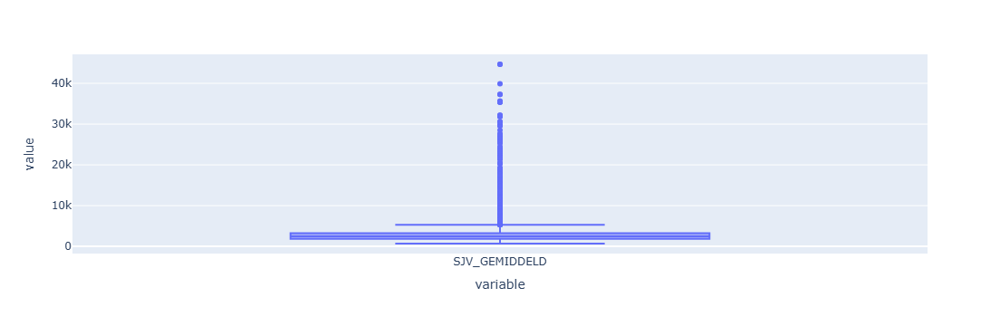

In [46]:
px.box(postcode_grenz_2021_elk.SJV_GEMIDDELD)

In [47]:
gdf_postcode_2021_elk = gpd.GeoDataFrame(postcode_grenz_2021_elk, geometry = "geometry")
gdf_postcode_2021_elk

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,geometry
0,9711AA,9711AC,13,6879.080,9711AA,"POLYGON ((233438.109 581446.772, 233438.908 58..."
1,9711AD,9711AE,12,5443.750,9711AD,"POLYGON ((233374.874 581490.712, 233378.106 58..."
2,9711AG,9711AG,48,3559.960,9711AG,"MULTIPOLYGON (((233440.703 581357.647, 233417...."
3,9711AH,9711AJ,30,1387.900,9711AH,"POLYGON ((233493.931 581473.687, 233494.015 58..."
4,9711AK,9711AK,15,1476.330,9711AK,"POLYGON ((233364.15 581578.063, 233364.382 581..."
...,...,...,...,...,...,...
9316,9746TG,9746TJ,17,12235.760,9746TJ,"MULTIPOLYGON (((230349.01 584532.051, 230351.1..."
9317,9746TK,9746TL,26,4263.880,9746TL,"MULTIPOLYGON (((230381.402 583948.527, 230544...."
9318,9746TM,9746TN,15,4250.130,9746TN,"MULTIPOLYGON (((231199.994 584030.946, 231232...."
9319,9747AC,9747AJ,10,6730.500,9747AJ,"MULTIPOLYGON (((231683.87 584318.182, 231685.6..."


In [48]:
type(gdf_postcode_2021_elk.SJV_GEMIDDELD)

pandas.core.series.Series

In [49]:
print(gdf_postcode_2021_elk['SJV_GEMIDDELD'].dtype)

float64


<Axes: >

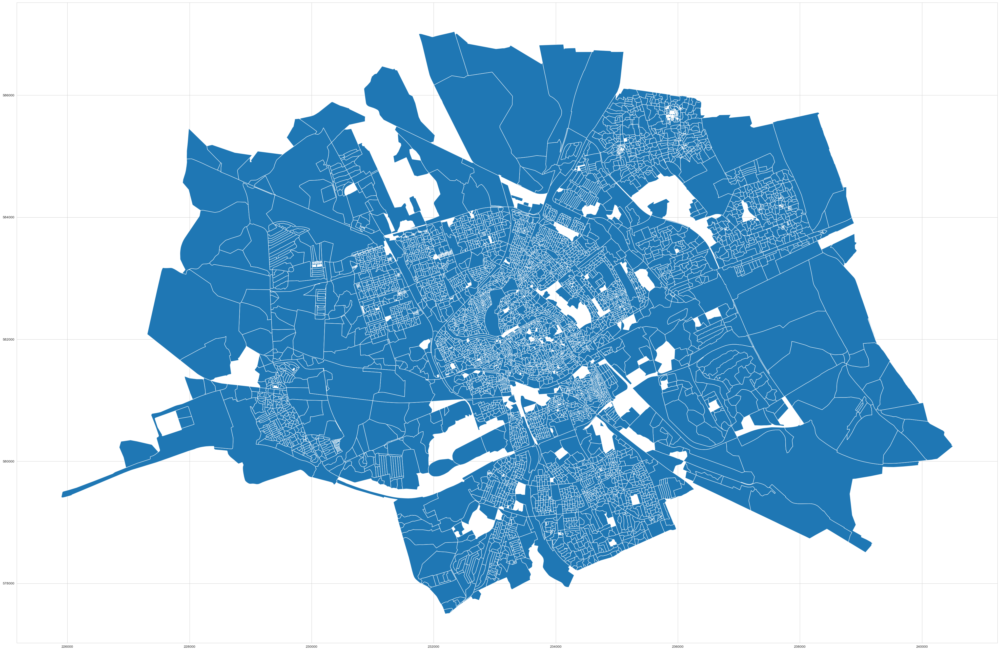

In [50]:
fig, ax = plt.subplots(figsize=(50, 50))
gdf_postcode_2021_elk.plot(ax=ax)

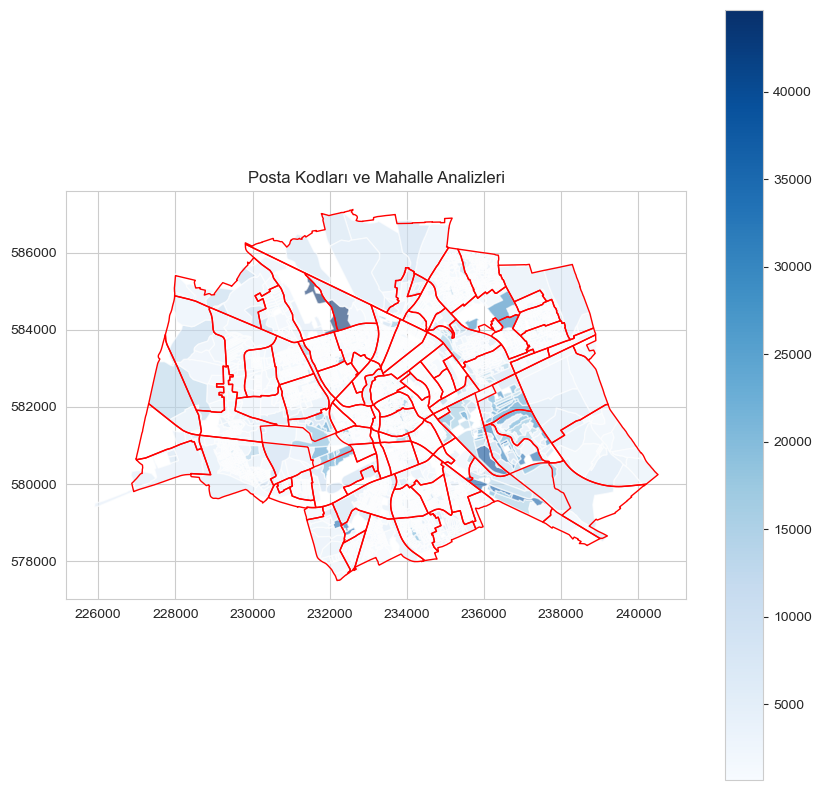

In [51]:
# Haritanın boyutlarını ayarlayalım
fig, ax = plt.subplots(figsize=(10, 10))

# Posta kodlarına göre haritayı çizelim
gdf_postcode_2021_elk.plot(ax=ax, column='SJV_GEMIDDELD', cmap='Blues', legend=True, alpha=0.6)

# Mahalle sınırlarını ekleyelim
gdf.boundary.plot(ax=ax, color='red', linewidth=1)

# Haritayı göster
plt.title("Posta Kodları ve Mahalle Analizleri")
plt.show()

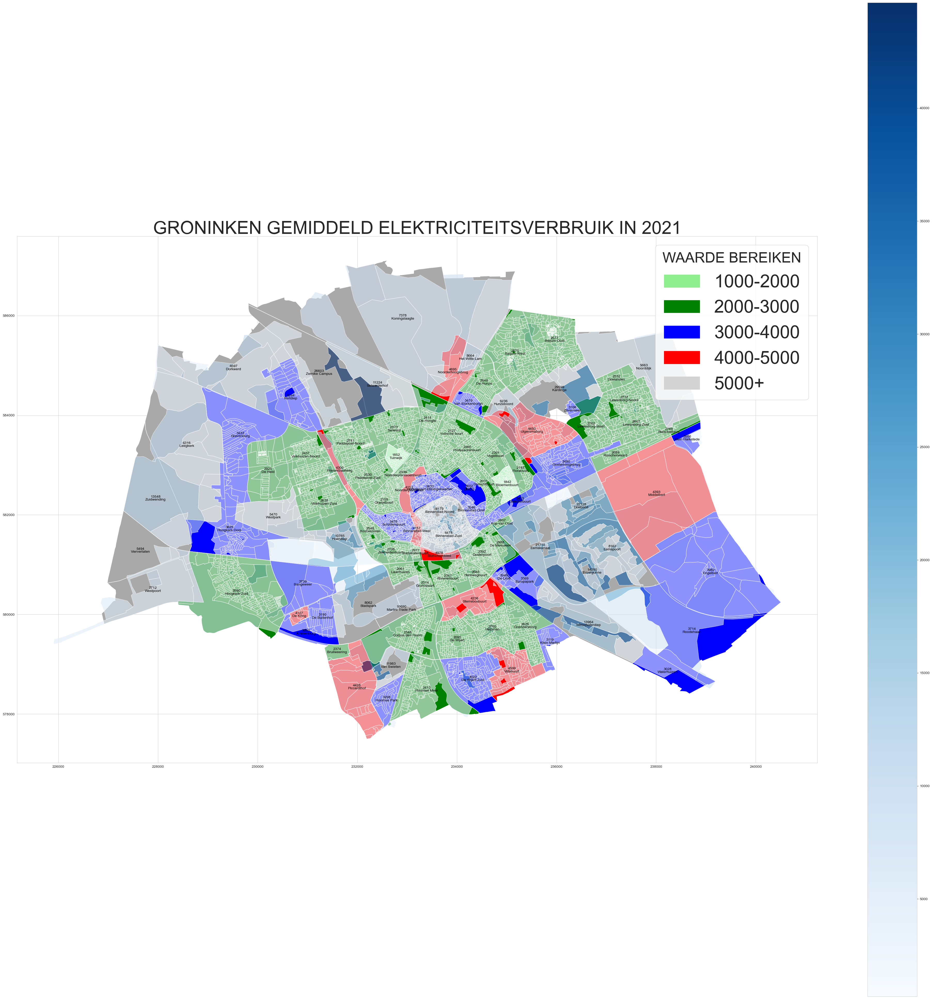

In [52]:

def color_scale(value):
    if pd.isnull(value):  # Değerin boş olup olmadığını kontrol et
        return 'grey'  # Boş değer için varsayılan renk
    elif 1000 <= value < 2000:
        return 'lightgreen'
    elif 2000 <= value < 3000:
        return 'green'
    elif 3000 <= value < 4000:
        return 'blue'
    elif 4000 <= value < 5000:
        return 'red'
    elif value >= 5000:
        return 'darkgrey'
    else:
        return 'grey'  # Eğer başka bir değer varsa

# Renkleri atama
gdf['color'] = gdf['elk_gemiddeld'].apply(color_scale)
gdf['centroid'] = gdf.geometry.centroid
fig, ax = plt.subplots(figsize=(50, 50))
gdf.plot(ax=ax, color=gdf['color'], edgecolor='white'  ) # Sınırları çiz
for idx, row in gdf.iterrows():
    ax.text(row['centroid'].x, row['centroid'].y - 30, s=row['Buurtnaam'],
         horizontalalignment='center', fontsize=10, color='black')
    ax.text(s=row['elk_gemiddeld'],  # Değer
             x=row['centroid'].x, 
             y=row['centroid'].y + 30,  # Y koordinatını biraz aşağıda ayarlayın
             horizontalalignment='center', fontsize=10, color='black')

legend_patches = [
    mpatches.Patch(color='lightgreen', label='1000-2000'),
    mpatches.Patch(color='green', label='2000-3000'),
    mpatches.Patch(color='blue', label='3000-4000'),
    mpatches.Patch(color='red', label='4000-5000'),
    mpatches.Patch(color='lightgray', label='5000+')
]
# plt.savefig('groningen_elk_2021_kaart.pdf', dpi = 300, bbox_inches = 'tight') # haritayi kaydetme 
# Efsaneyi (legend) haritaya ekleyin
plt.legend(handles=legend_patches, title="WAARDE BEREIKEN", loc='upper right', prop = {'size' : 50} , title_fontsize = 40)
plt.title('GRONINKEN GEMIDDELD ELEKTRICITEITSVERBRUIK IN 2021' , fontsize = 50 )

gdf_postcode_2021_elk.plot(ax=ax, column='SJV_GEMIDDELD', cmap='Blues', legend=True, alpha=0.6)
plt.show()

In [53]:
!pip install folium

In [54]:
import folium

In [55]:
import folium

# Harita nesnesi oluşturuluyor
m = folium.Map(location=[53.2194, 6.5665], zoom_start=12)

# GeoJson ile görselleştirme
folium.GeoJson(
    gdf_postcode_2021_elk,  # GeoDataFrame veya GeoJSON objeniz
    style_function=lambda feature: {
        'fillColor': 'green' if feature['properties']['SJV_GEMIDDELD'] > 1000 else 'red',
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.5
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['POSTCODE_VAN', 'SJV_GEMIDDELD'],  # Tooltip'te göstereceğiniz sütunlar
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],  # Tooltip için alias'lar
        localize=True
    ),
    popup=folium.GeoJsonPopup(
        fields=['POSTCODE_VAN', 'SJV_GEMIDDELD'],  # Popup'ta göstereceğiniz sütunlar
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],  # Popup için alias'lar
        localize=True
    )
).add_to(m)

# Haritayı kaydedin
m.save('harita.html')

In [56]:
postcode_grenz_2021_elk.SJV_GEMIDDELD.describe()

count    5203.000
mean     3449.887
std      3690.876
min       684.350
25%      1845.585
50%      2448.390
75%      3247.865
max     44669.910
Name: SJV_GEMIDDELD, dtype: float64

In [57]:

# Harita nesnesi oluşturuluyor
m = folium.Map(location=[53.2194, 6.5665], zoom_start=12)

# Renkleri aralıklarına göre ayarlayan fonksiyon
def get_color(value):
    if value < 1814.645:
        return 'green'
    elif 1814.645 <= value <  2393.000:
        return 'yellow'
    elif  2393.000 <= value < 3133.323:
        return 'blue'
    else:
        return 'red'

# GeoJson ile görselleştirme
folium.GeoJson(
    gdf_postcode_2021_elk,  # GeoDataFrame veya GeoJSON objeniz
    style_function=lambda feature: {
        'fillColor': get_color(feature['properties']['SJV_GEMIDDELD']),  # Renklendirme fonksiyonu
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.6
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['POSTCODE_VAN', 'SJV_GEMIDDELD'],  # Tooltip'te göstereceğiniz sütunlar
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],  # Tooltip için alias'lar
        localize=True
    ),
    popup=folium.GeoJsonPopup(
        fields=['POSTCODE_VAN', 'SJV_GEMIDDELD'],  # Popup'ta göstereceğiniz sütunlar
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],  # Popup için alias'lar
        localize=True
    )
).add_to(m)

# Haritayı kaydedin
m.save('kleur van kaartjes.html')

In [58]:
import folium
import matplotlib.cm as cm
import matplotlib.colors as colors

# Elektrik kullanım değerleri arasında normalize etmek için yardımcı fonksiyon
def normalize(value, min_value, max_value):
    return (value - min_value) / (max_value - min_value)

# Harita nesnesi oluşturuluyor
m = folium.Map(location=[53.2194, 6.5665], zoom_start=12)

# Renk haritası seçimi (en düşük yeşil, en yüksek kırmızı olacak şekilde)
cmap = cm.get_cmap('RdYlGn_r')  # Ters çevrilmiş RdYlGn; düşük yeşil, yüksek kırmızı

# Elektrik kullanımı için minimum ve maksimum değerleri alın (örneğin, GeoDataFrame'den)
min_value = gdf_postcode_2021_elk['SJV_GEMIDDELD'].min()
max_value = gdf_postcode_2021_elk['SJV_GEMIDDELD'].max()

# GeoJson ile görselleştirme
folium.GeoJson(
    gdf_postcode_2021_elk,  # GeoDataFrame veya GeoJSON objeniz
    style_function=lambda feature: {
        # Normalize edilmiş değeri kullanarak renklendirme
        'fillColor': colors.to_hex(cmap(normalize(feature['properties']['SJV_GEMIDDELD'], min_value, max_value))),
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.6
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['POSTCODE_VAN', 'SJV_GEMIDDELD'],  # Tooltip'te göstereceğiniz sütunlar
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],  # Tooltip için alias'lar
        localize=True
    ),
    popup=folium.GeoJsonPopup(
        fields=['POSTCODE_VAN', 'SJV_GEMIDDELD'],  # Popup'ta göstereceğiniz sütunlar
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],  # Popup için alias'lar
        localize=True
    )
).add_to(m)

# Haritayı kaydedin
m.save('kleur_van_kaartjes.html')

In [59]:
import folium
import branca.colormap as cm  # Branca kütüphanesi ile renk aralığı

# Harita nesnesi oluşturuluyor
m = folium.Map(location=[53.2194, 6.5665], zoom_start=12)

# Renkleri aralıklarına göre ayarlayan fonksiyon
def get_color(value):
    if value < 1814.645:
        return 'green'
    elif 1814.645 <= value <  2393.000:
        return 'yellow'
    elif  2393.000 <= value < 3133.323:
        return 'blue'
    else:
        return 'red'

# GeoJson ile görselleştirme
folium.GeoJson(
    gdf_postcode_2021_elk,  # GeoDataFrame veya GeoJSON objeniz
    style_function=lambda feature: {
        'fillColor': get_color(feature['properties']['SJV_GEMIDDELD']),  # Renklendirme fonksiyonu
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.6
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['POSTCODE_VAN', 'SJV_GEMIDDELD'],  # Tooltip'te göstereceğiniz sütunlar
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],  # Tooltip için alias'lar
        localize=True
    ),
    popup=folium.GeoJsonPopup(
        fields=['POSTCODE_VAN', 'SJV_GEMIDDELD'],  # Popup'ta göstereceğiniz sütunlar
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],  # Popup için alias'lar
        localize=True
    )
).add_to(m)

# Renk aralığı oluşturma (Colormap)
colormap = cm.StepColormap(
    colors=['green', 'yellow', 'blue', 'red'],  # Renkler
    vmin=1000,  # Minimum değer
    vmax=4000,  # Maksimum değer (haritanızdaki en yüksek değerden biraz fazla olabilir)
    index=[1000,1814.645, 2393.000, 3133.323],  # Sınır değerler
    caption='WAARDE BEREIKEN (kWh)'  # Başlık
)

# Haritaya renk aralığını ekleyin
colormap.add_to(m)

# Haritayı kaydedin
m.save('kleur_van_kaartjes_met_legend.html')


In [60]:

from folium.plugins import Search

# Harita nesnesi oluşturuluyor
m = folium.Map(location=[53.2194, 6.5665], zoom_start=12)

# Renkleri aralıklarına göre ayarlayan fonksiyon
def get_color(value):
    if value < 1814.645:
        return 'green'
    elif 1814.645 <= value < 2393.000:
        return 'yellow'
    elif 2393.000 <= value < 3133.323:
        return 'blue'
    else:
        return 'red'

# GeoJson ile görselleştirme
geojson = folium.GeoJson(
    gdf_postcode_2021_elk,  # GeoDataFrame veya GeoJSON objeniz
    style_function=lambda feature: {
        'fillColor': get_color(feature['properties']['SJV_GEMIDDELD']),  # Renklendirme fonksiyonu
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.6
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['Postcode', 'SJV_GEMIDDELD'],  # Tooltip'te göstereceğiniz sütunlar
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],  # Tooltip için alias'lar
        localize=True
    ),
    popup=folium.GeoJsonPopup(
        fields=['Postcode', 'SJV_GEMIDDELD'],  # Popup'ta göstereceğiniz sütunlar
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],  # Popup için alias'lar
        localize=True
    )
).add_to(m)

# Renk aralığı (legend) oluşturma
colormap = cm.StepColormap(
    colors=['green', 'yellow', 'blue', 'red'],  # Renkler
    vmin=100,  # Minimum değer
    vmax=4000,  # Maksimum değer (haritanızdaki en yüksek değerden biraz fazla olabilir)
    index=[1000, 1814.645, 2393.000, 3133.323],  # Sınır değerler
    caption='Elektriciteitsverbuik (kWh)'  # Başlık
)

# Haritaya renk aralığını ekleyin
colormap.add_to(m)

# Posta kodlarına göre arama ekleyin
search = Search(
    layer=geojson,  # Aranacak GeoJson katmanı
    search_label='Postcode',  # Aranacak sütun (posta kodu)
    placeholder='ZOEKEN POSTCODE',  # Arama kutusu için yer tutucu
    collapsed=False , # Arama kutusu varsayılan olarak açık olsun mu
    search_zoom = 30
).add_to(m)

# Haritayı kaydedin
m.save('kleur_van_kaart.html')

In [61]:
from folium.plugins import Search

# Harita nesnesi oluşturuluyor
m = folium.Map(location=[53.2194, 6.5665], zoom_start=12)

# Renkleri aralıklarına göre ayarlayan fonksiyon
def get_color(value):
    if value < 1814.645:
        return 'green'
    elif 1814.645 <= value < 2393.000:
        return 'yellow'
    elif 2393.000 <= value < 3133.323:
        return 'blue'
    else:
        return 'red'

# GeoJson ile görselleştirme
geojson = folium.GeoJson(
    gdf_postcode_2021_elk,  # GeoDataFrame veya GeoJSON objeniz
    style_function=lambda feature: {
        'fillColor': get_color(feature['properties']['SJV_GEMIDDELD']),  # Renklendirme fonksiyonu
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.6
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['Postcode', 'SJV_GEMIDDELD'],  # Tooltip'te göstereceğiniz sütunlar
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],  # Alias'lar
        localize=True
    ),
    popup=folium.GeoJsonPopup(
        fields=['Postcode', 'SJV_GEMIDDELD'],  # Popup'ta göstereceğiniz sütunlar
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],  # Alias'lar
        localize=True
    )
).add_to(m)

# Renk aralığı (legend) oluşturma
colormap = cm.StepColormap(
    colors=['green', 'yellow', 'blue', 'red'],  # Renkler
    vmin=100,  # Minimum değer
    vmax=4000,  # Maksimum değer (haritanızdaki en yüksek değerden biraz fazla olabilir)
    index=[1000, 1814.645, 2393.000, 3133.323],  # Sınır değerler
    caption='Elektrik Tüketimi (kWh)'  # Başlık
)

# Haritaya renk aralığını ekleyin
colormap.add_to(m)

# Posta kodlarına göre arama ekleyin
search = Search(
    layer=geojson,  # Aranacak GeoJson katmanı
    search_label='Postcode',  # Aranacak sütun (posta kodu)
    placeholder='ZOEKEN POSTCODE',  # Arama kutusu için yer tutucu
    collapsed=False,  # Arama kutusu varsayılan olarak açık olsun mu
    search_zoom=30
).add_to(m)

# Haritayı kaydedin
m.save('kleur_van_kaart.html')

In [62]:
df_hren_elk_2021 = pd.read_csv('df_haren_elk_2021.csv')
df_hren_elk_2021

,index,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD
0,0,9751 AA,9751 AA,16,3729.880
1,1,9751 AB,9751 AB,16,3897.940
2,2,9751 AC,9751 AC,10,3872.300
3,3,9751 AD,9751 AE,24,5365.880
4,4,9751 AG,9751 AG,12,4007.170
...,...,...,...,...,...
482,482,9753 KX,9753 KX,19,3213.050
483,483,9753 KZ,9753 KZ,24,2846.250
484,484,9753 LA,9753 TA,26,8192.810
485,485,9753 TB,9753 TB,20,12119.250


In [63]:
df_hren_elk_2021['POSTCODE_TOT'] = df_hren_elk_2021['POSTCODE_TOT'].str.replace(' ','' )
df_hren_elk_2021

,index,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD
0,0,9751 AA,9751AA,16,3729.880
1,1,9751 AB,9751AB,16,3897.940
2,2,9751 AC,9751AC,10,3872.300
3,3,9751 AD,9751AE,24,5365.880
4,4,9751 AG,9751AG,12,4007.170
...,...,...,...,...,...
482,482,9753 KX,9753KX,19,3213.050
483,483,9753 KZ,9753KZ,24,2846.250
484,484,9753 LA,9753TA,26,8192.810
485,485,9753 TB,9753TB,20,12119.250


In [64]:
df_hren_elk_2021['POSTCODE_VAN'] = df_hren_elk_2021['POSTCODE_VAN'].str.replace(' ','' )
df_hren_elk_2021

,index,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD
0,0,9751AA,9751AA,16,3729.880
1,1,9751AB,9751AB,16,3897.940
2,2,9751AC,9751AC,10,3872.300
3,3,9751AD,9751AE,24,5365.880
4,4,9751AG,9751AG,12,4007.170
...,...,...,...,...,...
482,482,9753KX,9753KX,19,3213.050
483,483,9753KZ,9753KZ,24,2846.250
484,484,9753LA,9753TA,26,8192.810
485,485,9753TB,9753TB,20,12119.250


In [65]:
df_hren_elk_2021_van = pd.merge(df_hren_elk_2021,postcode_grenzen, left_on= 'POSTCODE_VAN' , right_on='Postcode' )
df_hren_elk_2021_van


,index,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,INWONER,MAN,VROUW,INW_014,...,AV5_ZIEK_E,AV10ZIEK_E,AV20ZIEK_E,AFS_ZIEK_I,AV5_ZIEK_I,AV10ZIEK_I,AV20ZIEK_I,AFS_APOTH,AFS_HAPOST,geometry
0,0,9751AA,9751AA,16,3729.880,9751AA,40,20,20,10,...,1.000,2.000,2.000,1.400,2.000,4.000,5.000,0.800,5.800,"POLYGON ((236077.523 577401.793, 236090.143 57..."
1,1,9751AB,9751AB,16,3897.940,9751AB,40,20,20,-99997,...,1.000,2.000,2.000,1.600,2.000,4.000,5.000,0.600,6.000,"POLYGON ((236283.689 577265.225, 236290.074 57..."
2,2,9751AC,9751AC,10,3872.300,9751AC,30,15,15,10,...,1.000,2.000,2.000,1.400,2.000,4.000,5.000,0.800,5.800,"POLYGON ((236185.277 577452.009, 236187.891 57..."
3,3,9751AD,9751AE,24,5365.880,9751AD,30,15,15,10,...,1.000,2.000,2.000,1.600,2.000,4.000,5.000,0.500,6.000,"POLYGON ((236362.57 577305.235, 236362.633 577..."
4,4,9751AG,9751AG,12,4007.170,9751AG,35,15,20,10,...,0.000,2.000,2.000,1.500,1.000,4.000,5.000,-99997.000,6.100,"POLYGON ((236622.699 577198.767, 236628.155 57..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
470,481,9753KV,9753KW,39,3092.100,9753KV,10,-99997,10,-99997,...,0.000,2.000,2.000,3.600,1.000,4.000,5.000,1.000,8.200,"POLYGON ((238238.913 576758.568, 238244.97 576..."
471,482,9753KX,9753KX,19,3213.050,9753KX,55,30,25,10,...,0.000,2.000,2.000,3.700,1.000,4.000,5.000,1.000,8.300,"POLYGON ((238283.627 576893.045, 238293.414 57..."
472,483,9753KZ,9753KZ,24,2846.250,9753KZ,70,35,35,15,...,0.000,2.000,2.000,3.800,1.000,4.000,5.000,1.100,8.400,"POLYGON ((238378.202 576933.28, 238379.437 576..."
473,484,9753LA,9753TA,26,8192.810,9753LA,5,-99997,-99997,-99997,...,0.000,2.000,2.000,3.800,1.000,4.000,5.000,-99997.000,8.500,"POLYGON ((238509.959 577006.176, 238537.143 57..."


In [66]:
df_hren_elk_2021_tot = pd.merge(df_hren_elk_2021,postcode_grenzen, left_on= 'POSTCODE_TOT' , right_on='Postcode' )
df_hren_elk_2021_tot

,index,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,INWONER,MAN,VROUW,INW_014,...,AV5_ZIEK_E,AV10ZIEK_E,AV20ZIEK_E,AFS_ZIEK_I,AV5_ZIEK_I,AV10ZIEK_I,AV20ZIEK_I,AFS_APOTH,AFS_HAPOST,geometry
0,0,9751AA,9751AA,16,3729.880,9751AA,40,20,20,10,...,1.000,2.000,2.000,1.400,2.000,4.000,5.000,0.800,5.800,"POLYGON ((236077.523 577401.793, 236090.143 57..."
1,1,9751AB,9751AB,16,3897.940,9751AB,40,20,20,-99997,...,1.000,2.000,2.000,1.600,2.000,4.000,5.000,0.600,6.000,"POLYGON ((236283.689 577265.225, 236290.074 57..."
2,2,9751AC,9751AC,10,3872.300,9751AC,30,15,15,10,...,1.000,2.000,2.000,1.400,2.000,4.000,5.000,0.800,5.800,"POLYGON ((236185.277 577452.009, 236187.891 57..."
3,3,9751AD,9751AE,24,5365.880,9751AE,20,10,10,-99997,...,0.000,2.000,2.000,1.700,1.000,4.000,5.000,0.400,6.100,"POLYGON ((236438.982 577096.34, 236462.341 577..."
4,4,9751AG,9751AG,12,4007.170,9751AG,35,15,20,10,...,0.000,2.000,2.000,1.500,1.000,4.000,5.000,-99997.000,6.100,"POLYGON ((236622.699 577198.767, 236628.155 57..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
473,481,9753KV,9753KW,39,3092.100,9753KW,95,45,55,25,...,0.000,2.000,2.000,3.700,1.000,4.000,5.000,1.100,8.400,"MULTIPOLYGON (((238477.527 576795.21, 238464.4..."
474,482,9753KX,9753KX,19,3213.050,9753KX,55,30,25,10,...,0.000,2.000,2.000,3.700,1.000,4.000,5.000,1.000,8.300,"POLYGON ((238283.627 576893.045, 238293.414 57..."
475,483,9753KZ,9753KZ,24,2846.250,9753KZ,70,35,35,15,...,0.000,2.000,2.000,3.800,1.000,4.000,5.000,1.100,8.400,"POLYGON ((238378.202 576933.28, 238379.437 576..."
476,484,9753LA,9753TA,26,8192.810,9753TA,35,20,15,10,...,0.000,2.000,2.000,3.500,1.000,4.000,5.700,-99997.000,8.200,"POLYGON ((237897.45 576080.184, 237878.308 576..."


In [67]:
df_haren_elk_2021 = pd.concat([df_hren_elk_2021_van, df_hren_elk_2021_tot], ignore_index =True)
df_haren_elk_2021 

,index,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,INWONER,MAN,VROUW,INW_014,...,AV5_ZIEK_E,AV10ZIEK_E,AV20ZIEK_E,AFS_ZIEK_I,AV5_ZIEK_I,AV10ZIEK_I,AV20ZIEK_I,AFS_APOTH,AFS_HAPOST,geometry
0,0,9751AA,9751AA,16,3729.880,9751AA,40,20,20,10,...,1.000,2.000,2.000,1.400,2.000,4.000,5.000,0.800,5.800,"POLYGON ((236077.523 577401.793, 236090.143 57..."
1,1,9751AB,9751AB,16,3897.940,9751AB,40,20,20,-99997,...,1.000,2.000,2.000,1.600,2.000,4.000,5.000,0.600,6.000,"POLYGON ((236283.689 577265.225, 236290.074 57..."
2,2,9751AC,9751AC,10,3872.300,9751AC,30,15,15,10,...,1.000,2.000,2.000,1.400,2.000,4.000,5.000,0.800,5.800,"POLYGON ((236185.277 577452.009, 236187.891 57..."
3,3,9751AD,9751AE,24,5365.880,9751AD,30,15,15,10,...,1.000,2.000,2.000,1.600,2.000,4.000,5.000,0.500,6.000,"POLYGON ((236362.57 577305.235, 236362.633 577..."
4,4,9751AG,9751AG,12,4007.170,9751AG,35,15,20,10,...,0.000,2.000,2.000,1.500,1.000,4.000,5.000,-99997.000,6.100,"POLYGON ((236622.699 577198.767, 236628.155 57..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
948,481,9753KV,9753KW,39,3092.100,9753KW,95,45,55,25,...,0.000,2.000,2.000,3.700,1.000,4.000,5.000,1.100,8.400,"MULTIPOLYGON (((238477.527 576795.21, 238464.4..."
949,482,9753KX,9753KX,19,3213.050,9753KX,55,30,25,10,...,0.000,2.000,2.000,3.700,1.000,4.000,5.000,1.000,8.300,"POLYGON ((238283.627 576893.045, 238293.414 57..."
950,483,9753KZ,9753KZ,24,2846.250,9753KZ,70,35,35,15,...,0.000,2.000,2.000,3.800,1.000,4.000,5.000,1.100,8.400,"POLYGON ((238378.202 576933.28, 238379.437 576..."
951,484,9753LA,9753TA,26,8192.810,9753TA,35,20,15,10,...,0.000,2.000,2.000,3.500,1.000,4.000,5.700,-99997.000,8.200,"POLYGON ((237897.45 576080.184, 237878.308 576..."


In [68]:
df_haren_elk_2021 = df_haren_elk_2021.drop_duplicates()
df_haren_elk_2021

,index,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,INWONER,MAN,VROUW,INW_014,...,AV5_ZIEK_E,AV10ZIEK_E,AV20ZIEK_E,AFS_ZIEK_I,AV5_ZIEK_I,AV10ZIEK_I,AV20ZIEK_I,AFS_APOTH,AFS_HAPOST,geometry
0,0,9751AA,9751AA,16,3729.880,9751AA,40,20,20,10,...,1.000,2.000,2.000,1.400,2.000,4.000,5.000,0.800,5.800,"POLYGON ((236077.523 577401.793, 236090.143 57..."
1,1,9751AB,9751AB,16,3897.940,9751AB,40,20,20,-99997,...,1.000,2.000,2.000,1.600,2.000,4.000,5.000,0.600,6.000,"POLYGON ((236283.689 577265.225, 236290.074 57..."
2,2,9751AC,9751AC,10,3872.300,9751AC,30,15,15,10,...,1.000,2.000,2.000,1.400,2.000,4.000,5.000,0.800,5.800,"POLYGON ((236185.277 577452.009, 236187.891 57..."
3,3,9751AD,9751AE,24,5365.880,9751AD,30,15,15,10,...,1.000,2.000,2.000,1.600,2.000,4.000,5.000,0.500,6.000,"POLYGON ((236362.57 577305.235, 236362.633 577..."
4,4,9751AG,9751AG,12,4007.170,9751AG,35,15,20,10,...,0.000,2.000,2.000,1.500,1.000,4.000,5.000,-99997.000,6.100,"POLYGON ((236622.699 577198.767, 236628.155 57..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
943,476,9753KJ,9753KL,24,1892.080,9753KL,45,25,20,5,...,0.000,2.000,2.000,3.500,1.000,4.000,5.000,0.900,8.100,"MULTIPOLYGON (((238059.713 576375.756, 238055...."
945,478,9753KN,9753KP,10,2500.100,9753KP,10,5,5,-99997,...,0.000,2.000,2.000,3.300,1.000,4.000,5.000,-99997.000,7.900,"POLYGON ((238021.195 576624.295, 238030.814 57..."
947,480,9753KS,9753KT,34,2857.850,9753KT,65,35,30,10,...,0.000,2.000,2.000,3.500,1.000,4.000,5.000,0.900,8.100,"POLYGON ((238224.155 576823.268, 238224.098 57..."
948,481,9753KV,9753KW,39,3092.100,9753KW,95,45,55,25,...,0.000,2.000,2.000,3.700,1.000,4.000,5.000,1.100,8.400,"MULTIPOLYGON (((238477.527 576795.21, 238464.4..."


In [69]:
df_haren_elk_2021[df_haren_elk_2021['Postcode'] == '9751AC']

,index,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,INWONER,MAN,VROUW,INW_014,...,AV5_ZIEK_E,AV10ZIEK_E,AV20ZIEK_E,AFS_ZIEK_I,AV5_ZIEK_I,AV10ZIEK_I,AV20ZIEK_I,AFS_APOTH,AFS_HAPOST,geometry
2,2,9751AC,9751AC,10,3872.300,9751AC,30,15,15,10,...,1.000,2.000,2.000,1.400,2.000,4.000,5.000,0.800,5.800,"POLYGON ((236185.277 577452.009, 236187.891 57..."


In [70]:
df_haren_elk_2021 = df_haren_elk_2021[['POSTCODE_VAN' , 'POSTCODE_TOT','AANSLUITINGEN_AANTAL', 'SJV_GEMIDDELD','Postcode', 'geometry']]
df_haren_elk_2021

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,geometry
0,9751AA,9751AA,16,3729.880,9751AA,"POLYGON ((236077.523 577401.793, 236090.143 57..."
1,9751AB,9751AB,16,3897.940,9751AB,"POLYGON ((236283.689 577265.225, 236290.074 57..."
2,9751AC,9751AC,10,3872.300,9751AC,"POLYGON ((236185.277 577452.009, 236187.891 57..."
3,9751AD,9751AE,24,5365.880,9751AD,"POLYGON ((236362.57 577305.235, 236362.633 577..."
4,9751AG,9751AG,12,4007.170,9751AG,"POLYGON ((236622.699 577198.767, 236628.155 57..."
...,...,...,...,...,...,...
943,9753KJ,9753KL,24,1892.080,9753KL,"MULTIPOLYGON (((238059.713 576375.756, 238055...."
945,9753KN,9753KP,10,2500.100,9753KP,"POLYGON ((238021.195 576624.295, 238030.814 57..."
947,9753KS,9753KT,34,2857.850,9753KT,"POLYGON ((238224.155 576823.268, 238224.098 57..."
948,9753KV,9753KW,39,3092.100,9753KW,"MULTIPOLYGON (((238477.527 576795.21, 238464.4..."


In [71]:
gdf_haren_elk_2021 = gpd.GeoDataFrame(df_haren_elk_2021, geometry = "geometry")
gdf_haren_elk_2021

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,geometry
0,9751AA,9751AA,16,3729.880,9751AA,"POLYGON ((236077.523 577401.793, 236090.143 57..."
1,9751AB,9751AB,16,3897.940,9751AB,"POLYGON ((236283.689 577265.225, 236290.074 57..."
2,9751AC,9751AC,10,3872.300,9751AC,"POLYGON ((236185.277 577452.009, 236187.891 57..."
3,9751AD,9751AE,24,5365.880,9751AD,"POLYGON ((236362.57 577305.235, 236362.633 577..."
4,9751AG,9751AG,12,4007.170,9751AG,"POLYGON ((236622.699 577198.767, 236628.155 57..."
...,...,...,...,...,...,...
943,9753KJ,9753KL,24,1892.080,9753KL,"MULTIPOLYGON (((238059.713 576375.756, 238055...."
945,9753KN,9753KP,10,2500.100,9753KP,"POLYGON ((238021.195 576624.295, 238030.814 57..."
947,9753KS,9753KT,34,2857.850,9753KT,"POLYGON ((238224.155 576823.268, 238224.098 57..."
948,9753KV,9753KW,39,3092.100,9753KW,"MULTIPOLYGON (((238477.527 576795.21, 238464.4..."


In [72]:
df_ten_boer_elk_2021 = pd.read_csv('df_ten_boer_elk_2021.csv')
df_ten_boer_elk_2021

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD
0,9791 AB,9791 AB,10,6782.100
1,9791 AC,9791 AC,13,3896.310
2,9791 AD,9791 AD,26,2721.620
3,9791 AE,9791 BA,24,5885.420
4,9791 BB,9791 BB,31,3085.450
...,...,...,...,...
95,9791 TA,9791 TB,14,8785.500
96,9791 TC,9791 TE,19,6190.580
97,9791 TG,9791 TG,16,13128.310
98,9791 TH,9791 TH,12,2466.500


In [73]:
df_ten_boer_elk_2021['POSTCODE_VAN'] = df_ten_boer_elk_2021['POSTCODE_VAN'].str.replace(' ','' )
df_ten_boer_elk_2021

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD
0,9791AB,9791 AB,10,6782.100
1,9791AC,9791 AC,13,3896.310
2,9791AD,9791 AD,26,2721.620
3,9791AE,9791 BA,24,5885.420
4,9791BB,9791 BB,31,3085.450
...,...,...,...,...
95,9791TA,9791 TB,14,8785.500
96,9791TC,9791 TE,19,6190.580
97,9791TG,9791 TG,16,13128.310
98,9791TH,9791 TH,12,2466.500


In [74]:
df_ten_boer_elk_2021['POSTCODE_TOT'] = df_ten_boer_elk_2021['POSTCODE_TOT'].str.replace(' ','' )
df_ten_boer_elk_2021

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD
0,9791AB,9791AB,10,6782.100
1,9791AC,9791AC,13,3896.310
2,9791AD,9791AD,26,2721.620
3,9791AE,9791BA,24,5885.420
4,9791BB,9791BB,31,3085.450
...,...,...,...,...
95,9791TA,9791TB,14,8785.500
96,9791TC,9791TE,19,6190.580
97,9791TG,9791TG,16,13128.310
98,9791TH,9791TH,12,2466.500


In [75]:
df_ten_boer_elk_2021_van = pd.merge(df_ten_boer_elk_2021,postcode_grenzen, left_on= 'POSTCODE_VAN' , right_on='Postcode' )
df_ten_boer_elk_2021_van

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,INWONER,MAN,VROUW,INW_014,INW_1524,...,AV5_ZIEK_E,AV10ZIEK_E,AV20ZIEK_E,AFS_ZIEK_I,AV5_ZIEK_I,AV10ZIEK_I,AV20ZIEK_I,AFS_APOTH,AFS_HAPOST,geometry
0,9791AB,9791AB,10,6782.100,9791AB,20,15,10,-99997,-99997,...,0.000,0.000,3.000,8.000,0.000,1.000,6.000,0.300,10.500,"POLYGON ((242812.019 588629.191, 242818.408 58..."
1,9791AC,9791AC,13,3896.310,9791AC,35,15,15,5,5,...,0.000,0.000,3.000,8.000,0.000,1.000,6.000,0.300,10.600,"POLYGON ((242739.98 588427.831, 242783.15 5884..."
2,9791AD,9791AD,26,2721.620,9791AD,50,25,25,10,5,...,0.000,0.000,3.000,8.000,0.000,1.000,6.000,0.300,10.600,"POLYGON ((242527.42 588249.542, 242529.196 588..."
3,9791AE,9791BA,24,5885.420,9791AE,15,5,5,-99997,-99997,...,0.000,0.200,3.000,8.900,0.000,1.200,6.000,1.200,11.000,"POLYGON ((242301.31 587965.088, 242359.911 587..."
4,9791BB,9791BB,31,3085.450,9791BB,85,40,45,15,15,...,0.000,0.000,3.000,8.400,0.000,1.000,6.000,0.500,10.400,"MULTIPOLYGON (((241947.208 587919.031, 241961...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,9791TA,9791TB,14,8785.500,9791TA,10,5,5,-99997,-99997,...,0.000,1.000,3.000,8.100,0.000,2.000,6.000,-99997.000,8.800,"POLYGON ((240799.902 587352.259, 240825.606 58..."
95,9791TC,9791TE,19,6190.580,9791TC,-99997,-99997,-99997,-99997,-99997,...,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,-99997.000,"POLYGON ((243288.951 589371.462, 243291.346 58..."
96,9791TG,9791TG,16,13128.310,9791TG,40,20,20,5,-99997,...,0.000,0.000,3.000,8.400,0.000,1.000,6.000,0.700,11.000,"POLYGON ((243333.717 589351.724, 243361.441 58..."
97,9791TH,9791TH,12,2466.500,9791TH,35,20,15,10,5,...,0.000,0.000,3.000,8.200,0.000,1.000,6.000,0.500,10.700,"POLYGON ((242993.825 587978.425, 242990.926 58..."


In [76]:
df_ten_boer_elk_2021_tot = pd.merge(df_ten_boer_elk_2021,postcode_grenzen, left_on= 'POSTCODE_TOT' , right_on='Postcode' )
df_ten_boer_elk_2021_tot

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,INWONER,MAN,VROUW,INW_014,INW_1524,...,AV5_ZIEK_E,AV10ZIEK_E,AV20ZIEK_E,AFS_ZIEK_I,AV5_ZIEK_I,AV10ZIEK_I,AV20ZIEK_I,AFS_APOTH,AFS_HAPOST,geometry
0,9791AB,9791AB,10,6782.100,9791AB,20,15,10,-99997,-99997,...,0.000,0.000,3.000,8.000,0.000,1.000,6.000,0.300,10.500,"POLYGON ((242812.019 588629.191, 242818.408 58..."
1,9791AC,9791AC,13,3896.310,9791AC,35,15,15,5,5,...,0.000,0.000,3.000,8.000,0.000,1.000,6.000,0.300,10.600,"POLYGON ((242739.98 588427.831, 242783.15 5884..."
2,9791AD,9791AD,26,2721.620,9791AD,50,25,25,10,5,...,0.000,0.000,3.000,8.000,0.000,1.000,6.000,0.300,10.600,"POLYGON ((242527.42 588249.542, 242529.196 588..."
3,9791AE,9791BA,24,5885.420,9791BA,55,30,30,20,-99997,...,0.000,0.000,3.000,8.200,0.000,1.000,6.000,0.300,10.200,"POLYGON ((242007.632 588118.606, 242009.92 588..."
4,9791BB,9791BB,31,3085.450,9791BB,85,40,45,15,15,...,0.000,0.000,3.000,8.400,0.000,1.000,6.000,0.500,10.400,"MULTIPOLYGON (((241947.208 587919.031, 241961...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,9791TA,9791TB,14,8785.500,9791TB,20,10,10,-99997,-99997,...,0.000,0.500,3.000,8.600,0.000,1.500,6.000,1.100,9.400,"POLYGON ((241638.024 588211.863, 241681.499 58..."
95,9791TC,9791TE,19,6190.580,9791TE,40,20,20,-99997,5,...,0.000,0.300,3.000,9.000,0.000,1.100,6.000,1.400,10.400,"POLYGON ((242704.629 588056.685, 242718.096 58..."
96,9791TG,9791TG,16,13128.310,9791TG,40,20,20,5,-99997,...,0.000,0.000,3.000,8.400,0.000,1.000,6.000,0.700,11.000,"POLYGON ((243333.717 589351.724, 243361.441 58..."
97,9791TH,9791TH,12,2466.500,9791TH,35,20,15,10,5,...,0.000,0.000,3.000,8.200,0.000,1.000,6.000,0.500,10.700,"POLYGON ((242993.825 587978.425, 242990.926 58..."


In [77]:
df_ten_boer_elk_2021 = pd.concat([df_ten_boer_elk_2021_van, df_ten_boer_elk_2021_tot], ignore_index =True)
df_ten_boer_elk_2021 

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,INWONER,MAN,VROUW,INW_014,INW_1524,...,AV5_ZIEK_E,AV10ZIEK_E,AV20ZIEK_E,AFS_ZIEK_I,AV5_ZIEK_I,AV10ZIEK_I,AV20ZIEK_I,AFS_APOTH,AFS_HAPOST,geometry
0,9791AB,9791AB,10,6782.100,9791AB,20,15,10,-99997,-99997,...,0.000,0.000,3.000,8.000,0.000,1.000,6.000,0.300,10.500,"POLYGON ((242812.019 588629.191, 242818.408 58..."
1,9791AC,9791AC,13,3896.310,9791AC,35,15,15,5,5,...,0.000,0.000,3.000,8.000,0.000,1.000,6.000,0.300,10.600,"POLYGON ((242739.98 588427.831, 242783.15 5884..."
2,9791AD,9791AD,26,2721.620,9791AD,50,25,25,10,5,...,0.000,0.000,3.000,8.000,0.000,1.000,6.000,0.300,10.600,"POLYGON ((242527.42 588249.542, 242529.196 588..."
3,9791AE,9791BA,24,5885.420,9791AE,15,5,5,-99997,-99997,...,0.000,0.200,3.000,8.900,0.000,1.200,6.000,1.200,11.000,"POLYGON ((242301.31 587965.088, 242359.911 587..."
4,9791BB,9791BB,31,3085.450,9791BB,85,40,45,15,15,...,0.000,0.000,3.000,8.400,0.000,1.000,6.000,0.500,10.400,"MULTIPOLYGON (((241947.208 587919.031, 241961...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,9791TA,9791TB,14,8785.500,9791TB,20,10,10,-99997,-99997,...,0.000,0.500,3.000,8.600,0.000,1.500,6.000,1.100,9.400,"POLYGON ((241638.024 588211.863, 241681.499 58..."
194,9791TC,9791TE,19,6190.580,9791TE,40,20,20,-99997,5,...,0.000,0.300,3.000,9.000,0.000,1.100,6.000,1.400,10.400,"POLYGON ((242704.629 588056.685, 242718.096 58..."
195,9791TG,9791TG,16,13128.310,9791TG,40,20,20,5,-99997,...,0.000,0.000,3.000,8.400,0.000,1.000,6.000,0.700,11.000,"POLYGON ((243333.717 589351.724, 243361.441 58..."
196,9791TH,9791TH,12,2466.500,9791TH,35,20,15,10,5,...,0.000,0.000,3.000,8.200,0.000,1.000,6.000,0.500,10.700,"POLYGON ((242993.825 587978.425, 242990.926 58..."


In [78]:
df_ten_boer_elk_2021 = df_ten_boer_elk_2021.drop_duplicates()
df_ten_boer_elk_2021

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,INWONER,MAN,VROUW,INW_014,INW_1524,...,AV5_ZIEK_E,AV10ZIEK_E,AV20ZIEK_E,AFS_ZIEK_I,AV5_ZIEK_I,AV10ZIEK_I,AV20ZIEK_I,AFS_APOTH,AFS_HAPOST,geometry
0,9791AB,9791AB,10,6782.100,9791AB,20,15,10,-99997,-99997,...,0.000,0.000,3.000,8.000,0.000,1.000,6.000,0.300,10.500,"POLYGON ((242812.019 588629.191, 242818.408 58..."
1,9791AC,9791AC,13,3896.310,9791AC,35,15,15,5,5,...,0.000,0.000,3.000,8.000,0.000,1.000,6.000,0.300,10.600,"POLYGON ((242739.98 588427.831, 242783.15 5884..."
2,9791AD,9791AD,26,2721.620,9791AD,50,25,25,10,5,...,0.000,0.000,3.000,8.000,0.000,1.000,6.000,0.300,10.600,"POLYGON ((242527.42 588249.542, 242529.196 588..."
3,9791AE,9791BA,24,5885.420,9791AE,15,5,5,-99997,-99997,...,0.000,0.200,3.000,8.900,0.000,1.200,6.000,1.200,11.000,"POLYGON ((242301.31 587965.088, 242359.911 587..."
4,9791BB,9791BB,31,3085.450,9791BB,85,40,45,15,15,...,0.000,0.000,3.000,8.400,0.000,1.000,6.000,0.500,10.400,"MULTIPOLYGON (((241947.208 587919.031, 241961...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,9791HB,9791HE,16,11400.380,9791HE,35,20,15,5,-99997,...,0.000,0.000,3.000,6.900,0.000,1.000,6.000,0.800,11.400,"POLYGON ((242122.395 590528.686, 242143.049 59..."
168,9791KC,9791KE,24,2630.790,9791KE,35,20,15,-99997,5,...,0.000,0.000,3.000,7.500,0.000,1.000,6.000,0.400,10.900,"MULTIPOLYGON (((241904.901 588435.376, 241903...."
189,9791LX,9791MA,38,7162.550,9791MA,40,15,25,-99997,-99997,...,0.000,0.000,3.000,7.600,0.000,1.000,6.000,0.200,10.900,"POLYGON ((242405.995 588665.083, 242406.844 58..."
193,9791TA,9791TB,14,8785.500,9791TB,20,10,10,-99997,-99997,...,0.000,0.500,3.000,8.600,0.000,1.500,6.000,1.100,9.400,"POLYGON ((241638.024 588211.863, 241681.499 58..."


In [79]:
df_ten_boer_elk_2021 = df_ten_boer_elk_2021[['POSTCODE_VAN' , 'POSTCODE_TOT','AANSLUITINGEN_AANTAL', 'SJV_GEMIDDELD','Postcode', 'geometry']]
df_ten_boer_elk_2021

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,geometry
0,9791AB,9791AB,10,6782.100,9791AB,"POLYGON ((242812.019 588629.191, 242818.408 58..."
1,9791AC,9791AC,13,3896.310,9791AC,"POLYGON ((242739.98 588427.831, 242783.15 5884..."
2,9791AD,9791AD,26,2721.620,9791AD,"POLYGON ((242527.42 588249.542, 242529.196 588..."
3,9791AE,9791BA,24,5885.420,9791AE,"POLYGON ((242301.31 587965.088, 242359.911 587..."
4,9791BB,9791BB,31,3085.450,9791BB,"MULTIPOLYGON (((241947.208 587919.031, 241961...."
...,...,...,...,...,...,...
156,9791HB,9791HE,16,11400.380,9791HE,"POLYGON ((242122.395 590528.686, 242143.049 59..."
168,9791KC,9791KE,24,2630.790,9791KE,"MULTIPOLYGON (((241904.901 588435.376, 241903...."
189,9791LX,9791MA,38,7162.550,9791MA,"POLYGON ((242405.995 588665.083, 242406.844 58..."
193,9791TA,9791TB,14,8785.500,9791TB,"POLYGON ((241638.024 588211.863, 241681.499 58..."


In [80]:
gdf_ten_boer_elk_2021 = gpd.GeoDataFrame(df_ten_boer_elk_2021, geometry = "geometry")
gdf_ten_boer_elk_2021

,POSTCODE_VAN,POSTCODE_TOT,AANSLUITINGEN_AANTAL,SJV_GEMIDDELD,Postcode,geometry
0,9791AB,9791AB,10,6782.100,9791AB,"POLYGON ((242812.019 588629.191, 242818.408 58..."
1,9791AC,9791AC,13,3896.310,9791AC,"POLYGON ((242739.98 588427.831, 242783.15 5884..."
2,9791AD,9791AD,26,2721.620,9791AD,"POLYGON ((242527.42 588249.542, 242529.196 588..."
3,9791AE,9791BA,24,5885.420,9791AE,"POLYGON ((242301.31 587965.088, 242359.911 587..."
4,9791BB,9791BB,31,3085.450,9791BB,"MULTIPOLYGON (((241947.208 587919.031, 241961...."
...,...,...,...,...,...,...
156,9791HB,9791HE,16,11400.380,9791HE,"POLYGON ((242122.395 590528.686, 242143.049 59..."
168,9791KC,9791KE,24,2630.790,9791KE,"MULTIPOLYGON (((241904.901 588435.376, 241903...."
189,9791LX,9791MA,38,7162.550,9791MA,"POLYGON ((242405.995 588665.083, 242406.844 58..."
193,9791TA,9791TB,14,8785.500,9791TB,"POLYGON ((241638.024 588211.863, 241681.499 58..."


In [81]:
import folium
from folium.plugins import Search
from branca import colormap
# Harita nesnesi oluşturuluyor
m = folium.Map(location=[53.2194, 6.5665], zoom_start=12)

# Renk fonksiyonu
def get_color(value):
    if value < 1814.645:
        return 'green'
    elif 1814.645 <= value < 2393.000:
        return 'yellow'
    elif 2393.000 <= value < 3133.323:
        return 'blue'
    else:
        return 'red'

# GeoJSON katmanları
geojson_groningen = folium.GeoJson(
    gdf_postcode_2021_elk,
    style_function=lambda feature: {
        'fillColor': get_color(feature['properties']['SJV_GEMIDDELD']),
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.4  # Opasiteyi artırdık (saydamlık %30)
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['Postcode', 'SJV_GEMIDDELD'],
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],
        localize=True
    ),
    popup=folium.GeoJsonPopup(
        fields=['Postcode', 'SJV_GEMIDDELD'],
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],
        localize=True
    )
)

geojson_ten_boer = folium.GeoJson(
    gdf_ten_boer_elk_2021,
    style_function=lambda feature: {
        'fillColor': get_color(feature['properties']['SJV_GEMIDDELD']),
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.4  # Opasiteyi artırdık (saydamlık %30)
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['Postcode', 'SJV_GEMIDDELD'],
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],
        localize=True
    ),
    popup=folium.GeoJsonPopup(
        fields=['Postcode', 'SJV_GEMIDDELD'],
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],
        localize=True
    )
)

geojson_haren = folium.GeoJson(
    gdf_haren_elk_2021,
    style_function=lambda feature: {
        'fillColor': get_color(feature['properties']['SJV_GEMIDDELD']),
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.4  # Opasiteyi artırdık (saydamlık %30)
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['Postcode', 'SJV_GEMIDDELD'],
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],
        localize=True
    ),
    popup=folium.GeoJsonPopup(
        fields=['Postcode', 'SJV_GEMIDDELD'],
        aliases=['POSTCODE:', 'GEMIDDELD ELEKTRICITEITSVERBRUIK (kWh):'],
        localize=True
    )
)

# Katmanları tek bir FeatureGroup içinde birleştiriyoruz
combined_geojson = folium.FeatureGroup(name="Combined GeoJSON")
combined_geojson.add_child(geojson_groningen)
combined_geojson.add_child(geojson_ten_boer)
combined_geojson.add_child(geojson_haren)

# Haritaya FeatureGroup'u ekliyoruz
combined_geojson.add_to(m)

# Arama fonksiyonunu tek bir katman üzerinde çalışacak şekilde ekliyoruz
search = Search(
    layer=combined_geojson,  # Birleştirilmiş katman üzerinde arama yapılacak
    search_label='Postcode',
    placeholder='ZOEKEN POSTCODE',
    collapsed=False,
    search_zoom=25,
    marker_type='circle'
).add_to(m)

# Renk aralığı (legend) ekleyin
colormap = colormap.StepColormap(
    colors=['green', 'yellow', 'blue', 'red'],
    vmin=100,
    vmax=4000,
    index=[1000, 1814.645, 2393.000, 3133.323],
    caption='ELEKTRICITEITSVERBRUIK (kWh)'
)
colormap.add_to(m)

# Haritayı kaydedin
m.save('kleur_van_kaart_with_search_transparent_elk.html')